In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /home/diar.bathish/.pytorch-datasets/George_W_Bush2.zip exists, skipping download.
Extracting /home/diar.bathish/.pytorch-datasets/George_W_Bush2.zip...
Extracted 532 to /home/diar.bathish/.pytorch-datasets/George_W_Bush/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


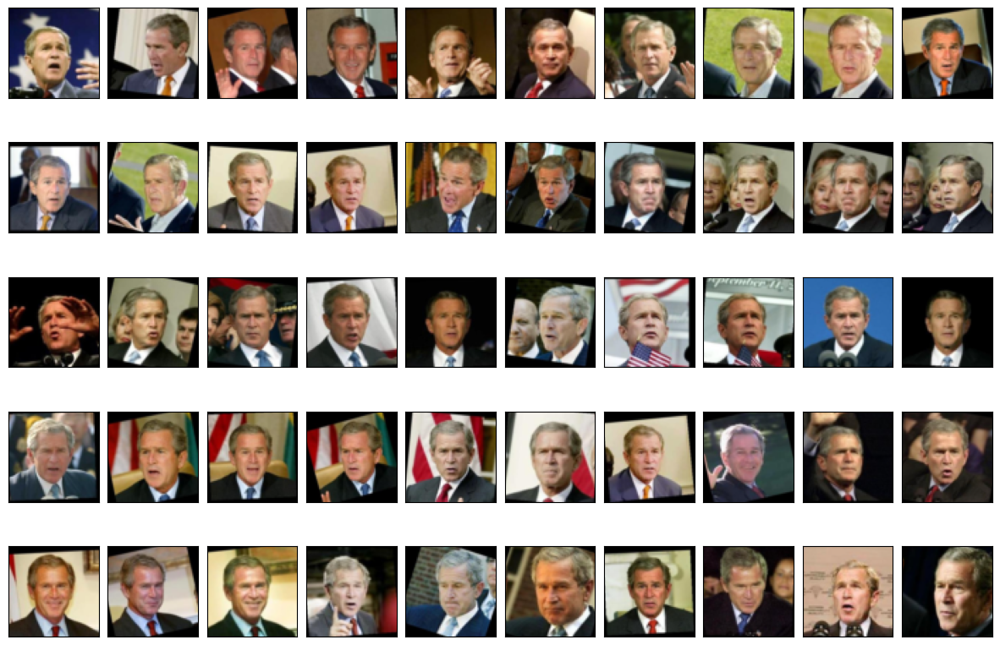

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): EncoderCNN(
    (cnn): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout2d(p=0.1, inplace=False)
      (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU()
      (7): Dropout2d(p=0.1, inplace=False)
      (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): Dropout2d(p=0.1, inplace=False)
      (12): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (13): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (14): ReLU()
      (15): Dropout2d(p=0.1, inplace=False)
      (16): 

**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)

xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (Seq): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (cnn): DecoderCNN(
    (cnn): Sequential(
      (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout2d(p=0.1, inplace=False)
      (4): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU()
      (7): Dropout2d(p=0.1, inplace=False)
      (8): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11)

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

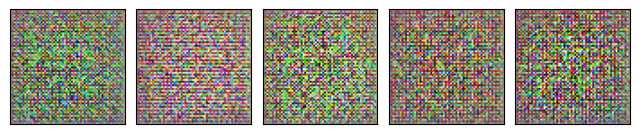

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [11]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 16, 'z_dim': 128, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0003, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0003, 'betas': (0.5, 0.999)}, 'data_label': 0, 'label_noise': 0.4}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.83it/s]
Discriminator loss: 0.5382732423570227
Generator loss:     5.9388336635687775


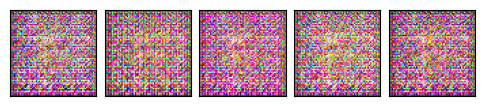

--- EPOCH 2/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.85it/s]
Discriminator loss: 0.17190652274910143
Generator loss:     6.382274894153371


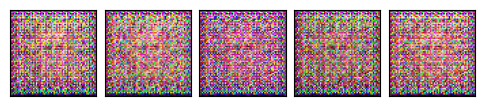

--- EPOCH 3/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.43it/s]
Discriminator loss: 0.3289898093789816
Generator loss:     4.987181411069982
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


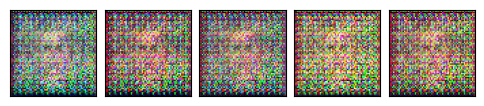

--- EPOCH 4/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 19.02it/s]
Discriminator loss: 0.20032811329207
Generator loss:     4.972598475568435
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


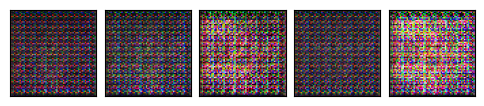

--- EPOCH 5/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.69it/s]
Discriminator loss: 0.2849678265149979
Generator loss:     4.3223115556380325
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


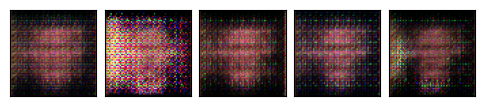

--- EPOCH 6/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.67it/s]
Discriminator loss: 0.8665709057274986
Generator loss:     3.5129718412371242
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


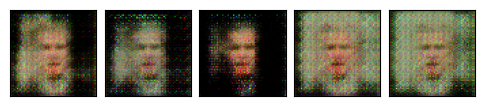

--- EPOCH 7/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.64it/s]
Discriminator loss: 0.7358700177248787
Generator loss:     2.7923839933731975
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


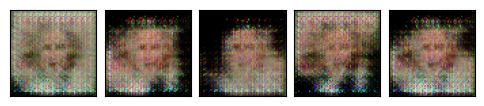

--- EPOCH 8/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.93it/s]
Discriminator loss: 0.7885826488628107
Generator loss:     3.0421834903604843


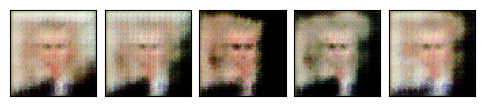

--- EPOCH 9/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.73it/s]
Discriminator loss: 0.854320300195147
Generator loss:     3.0676158526364494


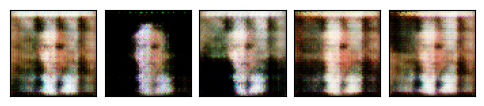

--- EPOCH 10/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.85it/s]
Discriminator loss: 0.9016257336034494
Generator loss:     2.848146610400256


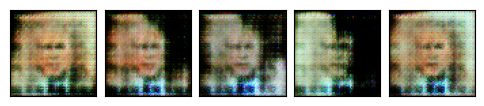

--- EPOCH 11/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.64it/s]
Discriminator loss: 0.7658912951455397
Generator loss:     3.3642800485386566


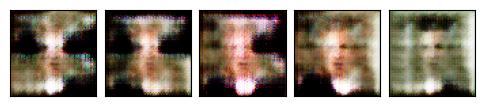

--- EPOCH 12/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.69it/s]
Discriminator loss: 0.74205714157399
Generator loss:     3.4873414214919594


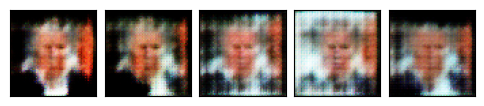

--- EPOCH 13/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.40it/s]
Discriminator loss: 0.6362576524124426
Generator loss:     3.6230215921121487


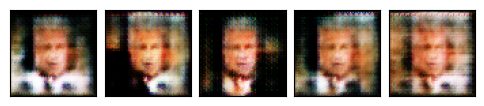

--- EPOCH 14/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.85it/s]
Discriminator loss: 0.6268165659378556
Generator loss:     3.7175208943731644


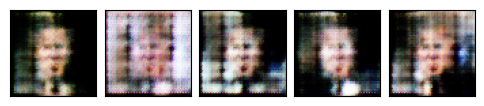

--- EPOCH 15/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.79it/s]
Discriminator loss: 0.6825814157286111
Generator loss:     3.927339126082028


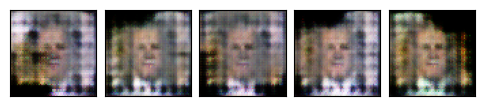

--- EPOCH 16/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.79it/s]
Discriminator loss: 0.6239652550395798
Generator loss:     4.013670149971457


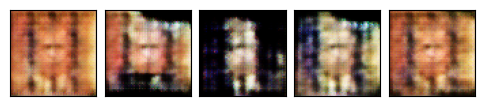

--- EPOCH 17/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.52it/s]
Discriminator loss: 0.7137265148408273
Generator loss:     3.871840098324944


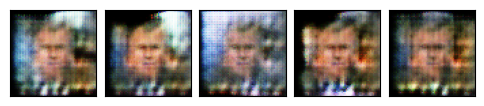

--- EPOCH 18/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.56it/s]
Discriminator loss: 0.9296114751521278
Generator loss:     3.797823511502322


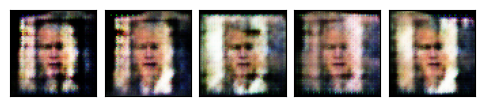

--- EPOCH 19/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.96it/s]
Discriminator loss: 0.6417683555799372
Generator loss:     4.249839572345509


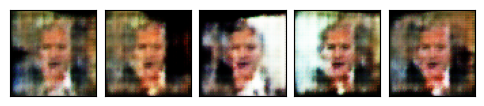

--- EPOCH 20/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.91it/s]
Discriminator loss: 0.5959809295394841
Generator loss:     4.4255686227013085


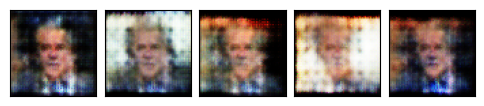

--- EPOCH 21/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.79it/s]
Discriminator loss: 0.6741634234238196
Generator loss:     4.611226719968459


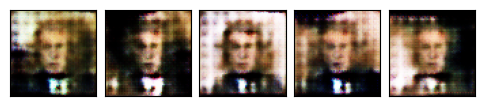

--- EPOCH 22/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.81it/s]
Discriminator loss: 0.5607061743297997
Generator loss:     4.346216419163873


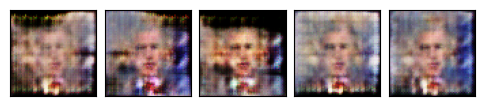

--- EPOCH 23/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.68it/s]
Discriminator loss: 0.8338499411064035
Generator loss:     4.304759656681734


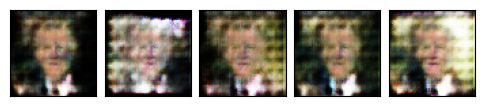

--- EPOCH 24/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.85it/s]
Discriminator loss: 0.6163269640768275
Generator loss:     4.137542510733885


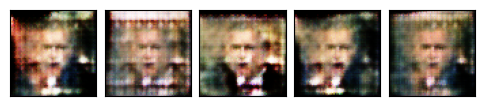

--- EPOCH 25/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.80it/s]
Discriminator loss: 0.6533646105843431
Generator loss:     4.633592696750865


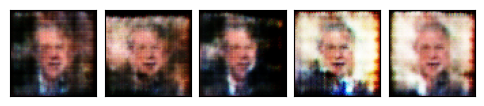

--- EPOCH 26/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.02it/s]
Discriminator loss: 0.5613612626843593
Generator loss:     4.686348396189072


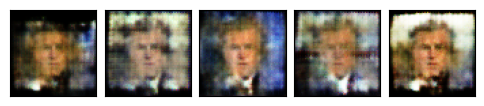

--- EPOCH 27/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.77it/s]
Discriminator loss: 0.43353846707545657
Generator loss:     4.802538079373977


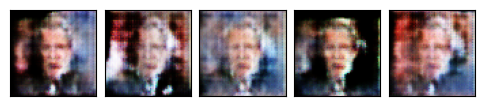

--- EPOCH 28/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.90it/s]
Discriminator loss: 0.7030077950261971
Generator loss:     4.664169767323663


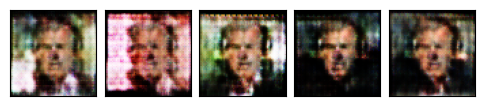

--- EPOCH 29/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.91it/s]
Discriminator loss: 0.48464871154111977
Generator loss:     5.081095534212449


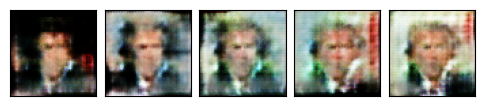

--- EPOCH 30/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.75it/s]
Discriminator loss: 0.5104519339168773
Generator loss:     5.209925588439493


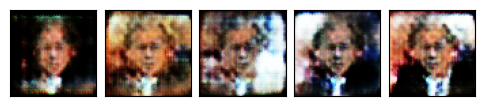

--- EPOCH 31/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.77it/s]
Discriminator loss: 0.4315020534045556
Generator loss:     5.522352520157309


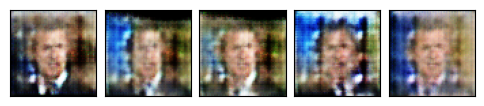

--- EPOCH 32/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.46it/s]
Discriminator loss: 0.5704190887729911
Generator loss:     5.344869017601013


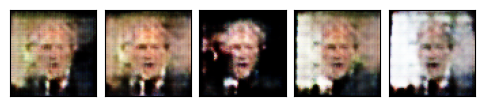

--- EPOCH 33/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.42it/s]
Discriminator loss: 0.5877076448763118
Generator loss:     4.458393181071562


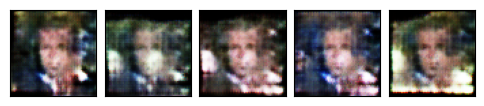

--- EPOCH 34/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.63it/s]
Discriminator loss: 0.5440306788419976
Generator loss:     5.187062151291791


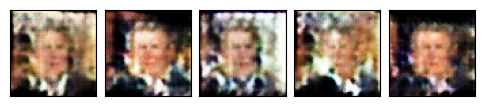

--- EPOCH 35/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.92it/s]
Discriminator loss: 0.5646927729249
Generator loss:     5.206967746510225


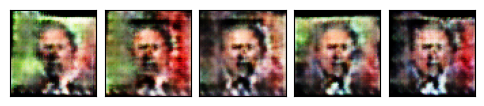

--- EPOCH 36/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.34it/s]
Discriminator loss: 0.7318224863094442
Generator loss:     4.691236962290371


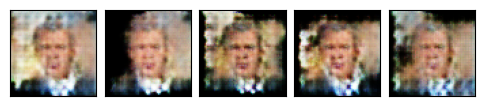

--- EPOCH 37/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.13it/s]
Discriminator loss: 0.5190540503929643
Generator loss:     4.4016030255485985


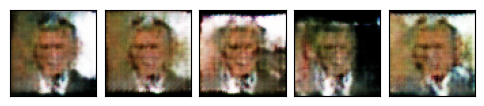

--- EPOCH 38/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.49it/s]
Discriminator loss: 0.3677528160898125
Generator loss:     5.378537409445819


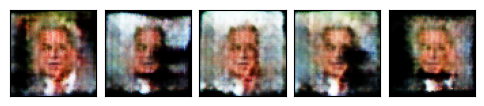

--- EPOCH 39/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.57it/s]
Discriminator loss: 0.5714726736221243
Generator loss:     5.454473818049712


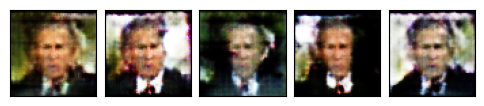

--- EPOCH 40/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.75it/s]
Discriminator loss: 0.5005850753582576
Generator loss:     5.0742519252440506


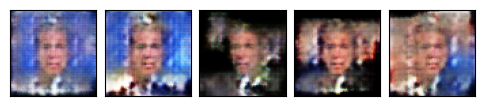

--- EPOCH 41/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.53it/s]
Discriminator loss: 0.5817724082838086
Generator loss:     5.456732020658605


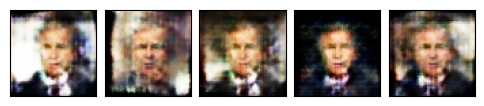

--- EPOCH 42/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.48it/s]
Discriminator loss: 0.42193606824559327
Generator loss:     5.332919352194843


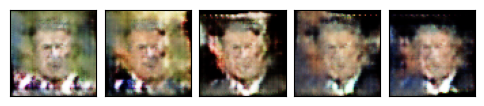

--- EPOCH 43/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.40it/s]
Discriminator loss: 0.5979105543126079
Generator loss:     5.409852767691893


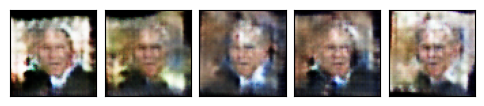

--- EPOCH 44/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.41it/s]
Discriminator loss: 0.4461620277999079
Generator loss:     5.03033929011401


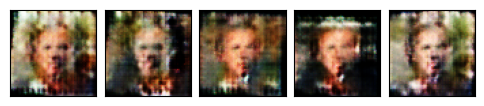

--- EPOCH 45/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.28it/s]
Discriminator loss: 0.37958484592244907
Generator loss:     5.730899495237014


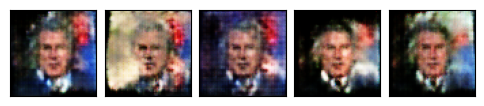

--- EPOCH 46/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.76it/s]
Discriminator loss: 0.5066731824703953
Generator loss:     5.369572667514577


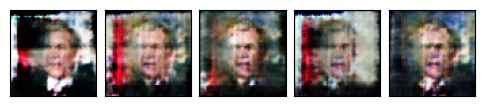

--- EPOCH 47/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.60it/s]
Discriminator loss: 0.6599182368201368
Generator loss:     5.286661533748402


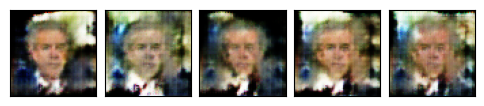

--- EPOCH 48/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.09it/s]
Discriminator loss: 0.4402775148696759
Generator loss:     5.102224090520074


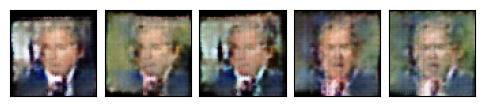

--- EPOCH 49/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.33it/s]
Discriminator loss: 0.47499929872505803
Generator loss:     5.154017280129826


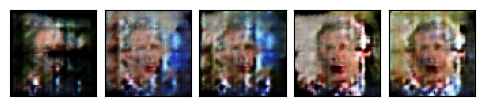

--- EPOCH 50/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.99it/s]
Discriminator loss: 0.6488944789504304
Generator loss:     5.885793777073131


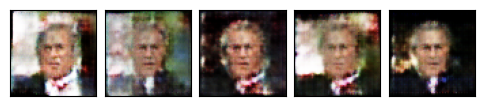

--- EPOCH 51/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.81it/s]
Discriminator loss: 0.4672826686326195
Generator loss:     4.933188876684974


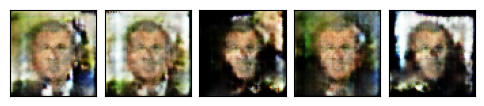

--- EPOCH 52/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.49it/s]
Discriminator loss: 0.43839639984071255
Generator loss:     5.8741293093737434


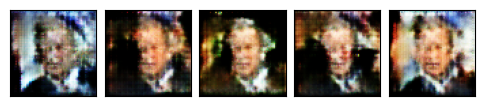

--- EPOCH 53/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.66it/s]
Discriminator loss: 0.3632076834054554
Generator loss:     5.238176282714395


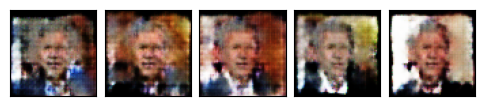

--- EPOCH 54/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 15.75it/s]
Discriminator loss: 0.3591194606440909
Generator loss:     5.903941505095538


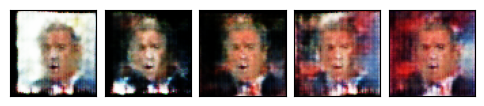

--- EPOCH 55/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 15.61it/s]
Discriminator loss: 0.33556719113360434
Generator loss:     5.334407424225526


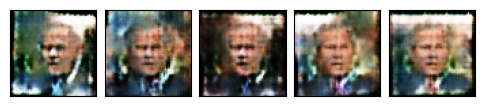

--- EPOCH 56/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 15.71it/s]
Discriminator loss: 0.4419717374531662
Generator loss:     5.496329661677866


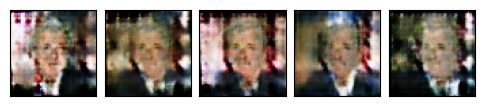

--- EPOCH 57/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 16.55it/s]
Discriminator loss: 0.466080655617749
Generator loss:     6.073760151863098


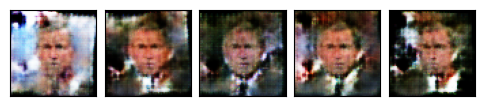

--- EPOCH 58/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 16.41it/s]
Discriminator loss: 0.3923337858389406
Generator loss:     5.007006021106944


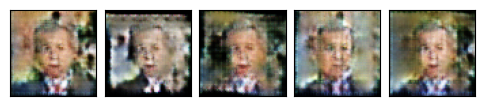

--- EPOCH 59/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 16.27it/s]
Discriminator loss: 0.4208732166272752
Generator loss:     6.583229348940008


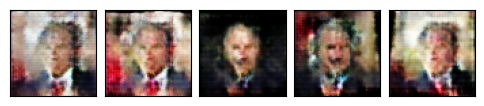

--- EPOCH 60/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 16.13it/s]
Discriminator loss: 0.606334087000612
Generator loss:     5.4120339150814445


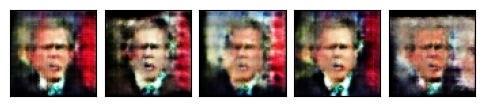

--- EPOCH 61/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 14.70it/s]
Discriminator loss: 0.4311289381893242
Generator loss:     5.464585381395676


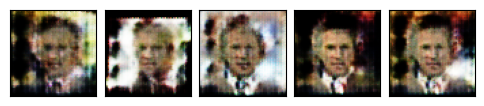

--- EPOCH 62/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 15.62it/s]
Discriminator loss: 0.3968467101016465
Generator loss:     6.380767766167136


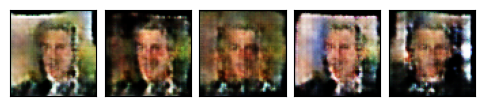

--- EPOCH 63/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 15.90it/s]
Discriminator loss: 0.6215424926622826
Generator loss:     5.12069229518666


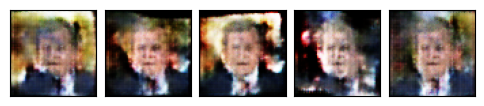

--- EPOCH 64/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 15.86it/s]
Discriminator loss: 0.4704963169882403
Generator loss:     5.333860320203445


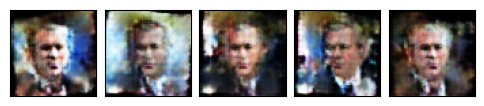

--- EPOCH 65/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.89it/s]
Discriminator loss: 0.6973632164299488
Generator loss:     4.851491815465338


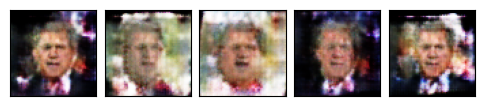

--- EPOCH 66/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:02<00:00, 15.32it/s]
Discriminator loss: 0.40293840132653713
Generator loss:     4.943592162693248


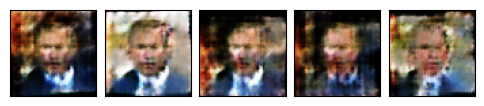

--- EPOCH 67/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.46it/s]
Discriminator loss: 0.38166895180064087
Generator loss:     5.560780913514249


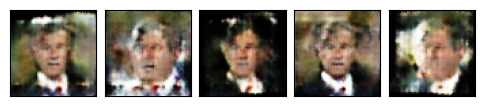

--- EPOCH 68/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.27it/s]
Discriminator loss: 0.6320343665121233
Generator loss:     4.7230539900415085


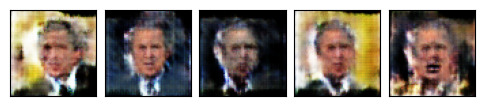

--- EPOCH 69/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.42it/s]
Discriminator loss: 0.4767988935551223
Generator loss:     4.479126853101394


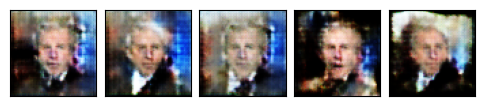

--- EPOCH 70/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.52it/s]
Discriminator loss: 0.4081219469799715
Generator loss:     5.213331176954157


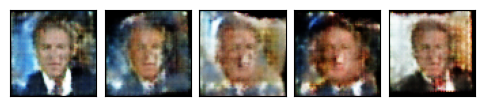

--- EPOCH 71/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.05it/s]
Discriminator loss: 0.3724881745874882
Generator loss:     5.953541790737825


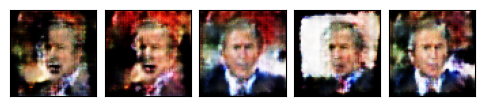

--- EPOCH 72/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.16it/s]
Discriminator loss: 0.40458259468569474
Generator loss:     6.02226509066189


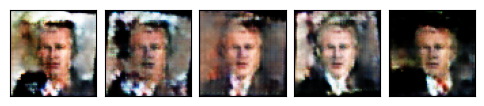

--- EPOCH 73/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.47it/s]
Discriminator loss: 0.3904068225666004
Generator loss:     5.810989099390366


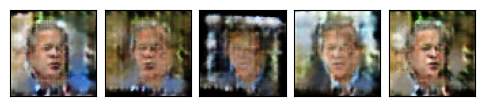

--- EPOCH 74/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.94it/s]
Discriminator loss: 0.42868616914047913
Generator loss:     6.300415763083627


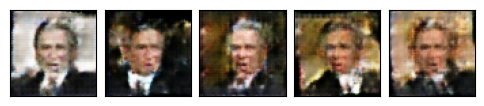

--- EPOCH 75/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.36it/s]
Discriminator loss: 0.3964336538577781
Generator loss:     5.864249047111063


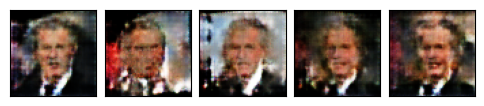

--- EPOCH 76/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.29it/s]
Discriminator loss: 0.3260994766126661
Generator loss:     6.263968671069426


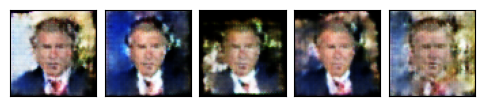

--- EPOCH 77/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.59it/s]
Discriminator loss: 0.4152963955831878
Generator loss:     6.524747140267316


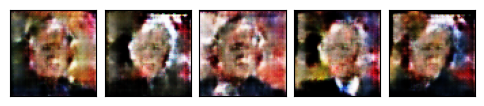

--- EPOCH 78/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.96it/s]
Discriminator loss: 0.17720961324213183
Generator loss:     7.012947748689091


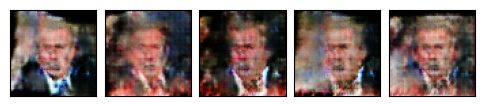

--- EPOCH 79/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.57it/s]
Discriminator loss: 0.3852789146716104
Generator loss:     6.121844228576212


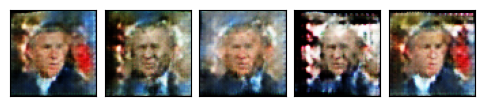

--- EPOCH 80/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 18.52it/s]
Discriminator loss: 0.2772521111456787
Generator loss:     6.087422314812155


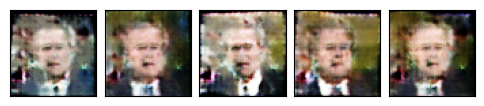

--- EPOCH 81/100 ---
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 34/34 [00:01<00:00, 17.79it/s]
Discriminator loss: 0.3341822704190717
Generator loss:     6.042785469223471


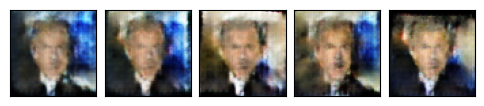

--- EPOCH 82/100 ---
  6%|██████▏                                                                                                   | 2/34 [00:00<00:01, 17.65it/s]

In [ ]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

In [ ]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [ ]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [ ]:
display_answer(hw3.answers.part2_q1)

### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [ ]:
display_answer(hw3.answers.part2_q2)

### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [ ]:
display_answer(hw3.answers.part2_q3)